## Shallow Water Wave Equations

In [2]:
from mpl_toolkits.mplot3d import axes3d
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
% matplotlib inline

# First, we need to define the true scale of our parameters
xdist = 20000000 # This represents the width of the pacific ocean at the equator
ydist = 4000000 # For simplicity, we will set the y scale to be the same as xdist
H = 4000 # Average depth of the Pacific Ocean
g = 9.8 # Gravitational constant
f = 0.00005
# We cannot allow our time steps to become less than 1/3 of the box width. in seconds
# Because the maximum velocity of the waves is about 3 m/s

# Non-dimensionalizing parameters
U = 1 # Velocity Scale
L = H # Length Scale
T = 1 # Time scale

//anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:24: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


(0, 1)

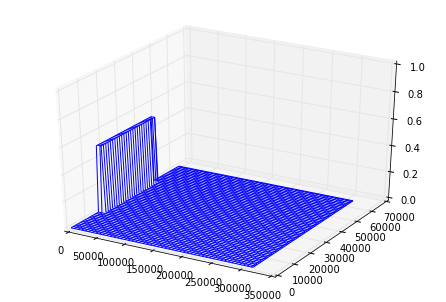

In [16]:
# For the Lax-Wendroff scheme, I need to build both  spatial and a time mesh

N = 100 # Define the number of grid points

# Define the mesh in space
xsteps = N
ysteps = N
xspan = np.linspace(0, xdist/L, xsteps)
yspan = np.linspace(0, ydist/L, ysteps)
X, Y = np.meshgrid(xspan, yspan)
dx = (xdist/L)/xsteps
dy = (ydist/L)/ysteps

# Define the mesh in time
t_init = 0; t_fin = 7500000.0 # ~length of 3 months (s)
tsteps = N-1
dt = (t_fin - t_init)/tsteps
t = np.linspace(t_init, t_fin, tsteps)

# Define the value grids
h = np.zeros((np.size(xspan),np.size(yspan))) 
ho = np.zeros((np.size(xspan),np.size(yspan))) 
# Initialize the first height perturbation
h[(xsteps/2-xsteps/4):(xsteps/2+xsteps/4), 0:3] = 0.5

u = np.zeros((np.size(xspan),np.size(yspan)))
uo = np.zeros((np.size(xspan),np.size(yspan)))
#u[(xsteps/2-xsteps/4):(xsteps/2+xsteps/4), 0:3] = 3.0

v = np.zeros((np.size(xspan),np.size(yspan)))
vo = np.zeros((np.size(xspan),np.size(yspan)))
#v[(xsteps/2-xsteps/4):(xsteps/2+xsteps/4), 0:3] = 3.0

# define the first frame 
fig = plt.figure()
ax = axes3d.Axes3D(fig)
wframe = ax.plot_wireframe(X, Y, h, rstride=2, cstride=2)
ax.set_zlim(0,1)

//anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:47: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
//anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:51: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
//anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:55: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


(0, 1)

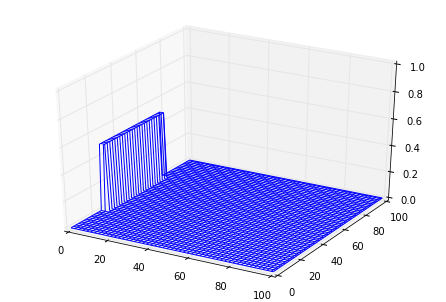

In [24]:
from mpl_toolkits.mplot3d import axes3d
import numpy as np
from numpy import *
import matplotlib.pyplot as plt
import matplotlib.animation as animation
% matplotlib inline

# First, we need to define the true scale of our parameters
xdist = 100
ydist = 100
#xdist = 20000000 # This represents the width of the pacific ocean at the equator
#ydist = 4000000 # For simplicity, we will set the y scale to be the same as xdist
H = 1 # Average depth of the Pacific Ocean
g = 9.8 # Gravitational constant
f = 0.00005

#Dimensionalizing constants
E=sqrt(H)
U=sqrt(g)
L=sqrt(H)
T=1/sqrt(g)

N = 100 # Define the number of grid points

# Define the mesh in space
xsteps = N
ysteps = N
xspan = np.linspace(0, xdist/L, xsteps)
yspan = np.linspace(0, ydist/L, ysteps)
X, Y = np.meshgrid(xspan, yspan)
# Initialize the dx and dy values
dx=10;dy=10
#dx = (xdist-0)/xsteps 
#dy = (ydist-0)/ysteps

# Define the mesh in time
#t_init = 0; t_fin = 20 #t_fin = 7500000 # ~length of 3 months (s)
#tsteps = N-1
#dt = (t_fin - t_init)/tsteps
#t = np.linspace(t_init, t_fin, tsteps)
dt=1

# Define the value grids
h = np.zeros((np.size(xspan),np.size(yspan))) 
ho = np.zeros((np.size(xspan),np.size(yspan))) 
# Initialize the first perturbation
h[(xsteps/2-xsteps/4):(xsteps/2+xsteps/4), 0:3] = 0.5/E

u = np.zeros((np.size(xspan),np.size(yspan)))
uo = np.zeros((np.size(xspan),np.size(yspan)))
u[(xsteps/2-xsteps/4):(xsteps/2+xsteps/4), 0:3] = 0 #3/U

v = np.zeros((np.size(xspan),np.size(yspan)))
vo = np.zeros((np.size(xspan),np.size(yspan)))
v[(xsteps/2-xsteps/4):(xsteps/2+xsteps/4), 0:3] = 0 #3/U

# define the first frame 
fig = plt.figure()
ax = axes3d.Axes3D(fig)
wframe = ax.plot_wireframe(X, Y, h, rstride=2, cstride=2)
ax.set_zlim(0,1)


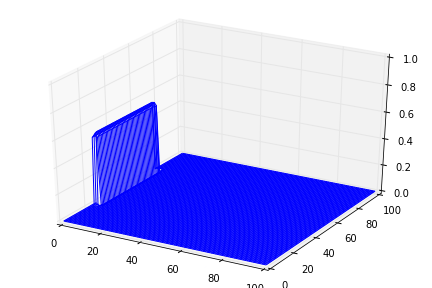
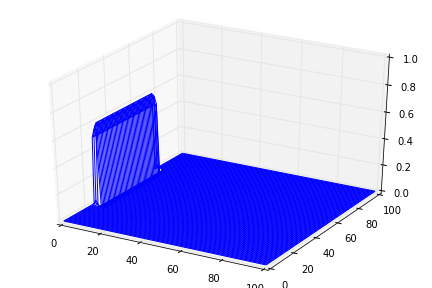
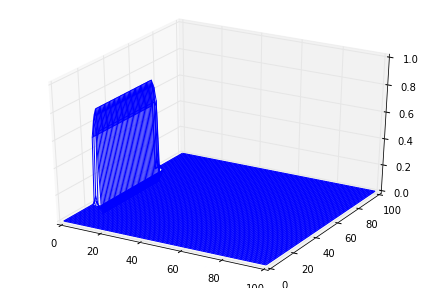
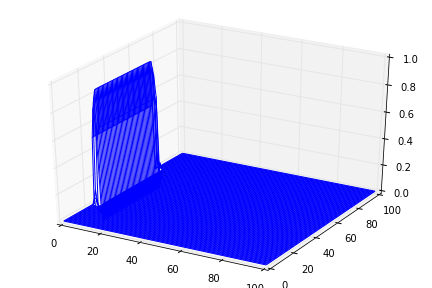
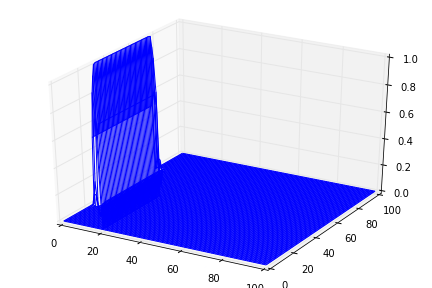
...
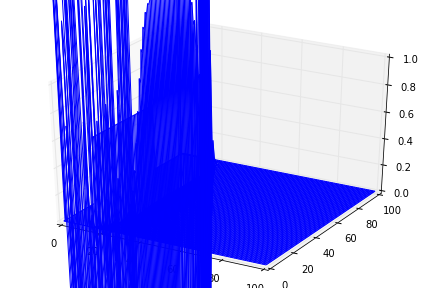
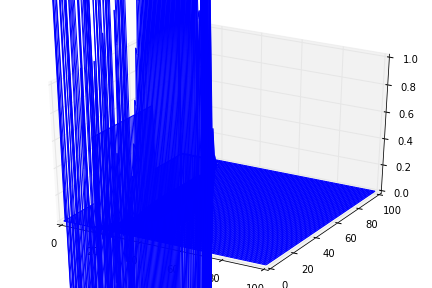
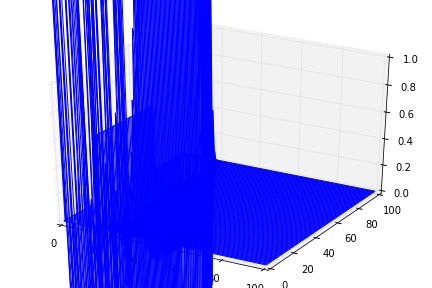
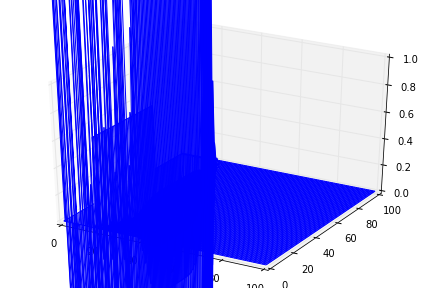
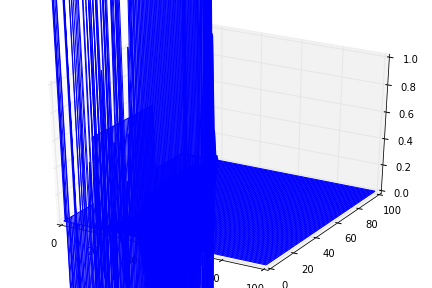

In [25]:
from JSAnimation.IPython_display import display_animation

# Coding up the PDEs at each time step
def update(i, ax, fig):
    ax.cla()
    ho = h; uo = u; vo = v
    
    for i in range(1,xsteps-2):
        for j in range(1,ysteps-2):
            h[i,j] = dt*(((-uo[i+1,j] - uo[i-1,j])/dx) - ((vo[i,j+1] - vo[i,j-1])/dy)) + ho[i,j]
            
            
    for i in range(1,xsteps-2):
        for j in range(1,ysteps-2):
            u[i+1,j] = dt*(((-h[i+2,j] - h[i,j])/dx) + f*vo[i+1,j]) + uo[i+1,j]
            v[i+1,j] = dt*(((-h[i,j+2] - h[i,j])/dx) - f*uo[i,j+1]) + uo[i+1,j]
                
    wframe = ax.plot_wireframe(X, Y, h)
    ax.set_zlim(0,1)
    return wframe

anim = animation.FuncAnimation(fig, update, 
        frames=range(100), 
        fargs=(ax, fig), interval=100)


display_animation(anim, default_mode='loop')

In [19]:
print(h)

[[  0.00000000e+000   0.00000000e+000   0.00000000e+000 ...,
    0.00000000e+000   0.00000000e+000   0.00000000e+000]
 [  0.00000000e+000  -6.93096680e+291   2.60405715e+293 ...,
    0.00000000e+000   0.00000000e+000   0.00000000e+000]
 [  0.00000000e+000   3.90353891e+293   3.73778988e+293 ...,
    0.00000000e+000   0.00000000e+000   0.00000000e+000]
 ..., 
 [  0.00000000e+000               inf               inf ...,
    0.00000000e+000   0.00000000e+000   0.00000000e+000]
 [  0.00000000e+000   0.00000000e+000   0.00000000e+000 ...,
    0.00000000e+000   0.00000000e+000   0.00000000e+000]
 [  0.00000000e+000   0.00000000e+000   0.00000000e+000 ...,
    0.00000000e+000   0.00000000e+000   0.00000000e+000]]



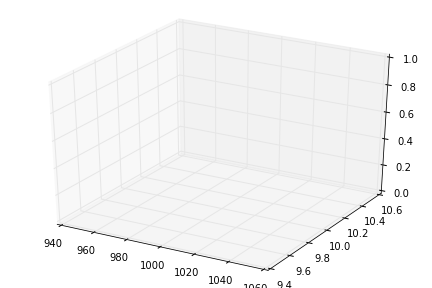
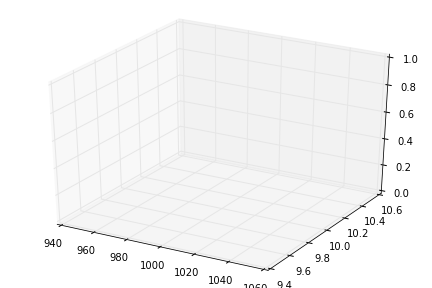
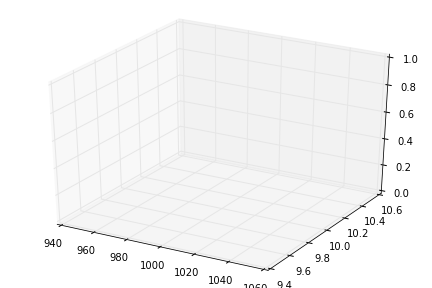
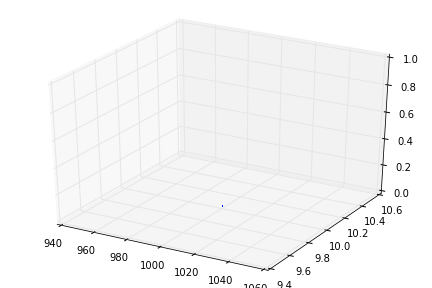
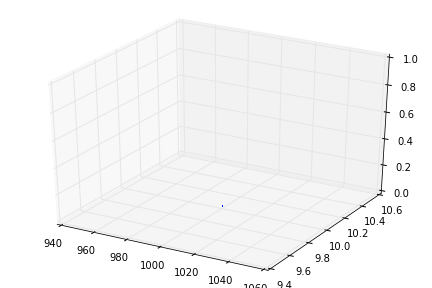
...
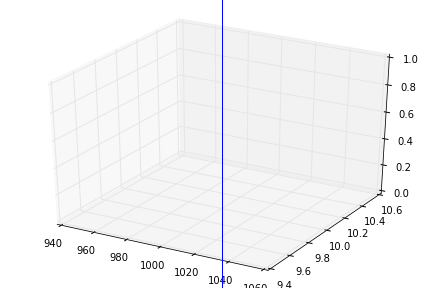
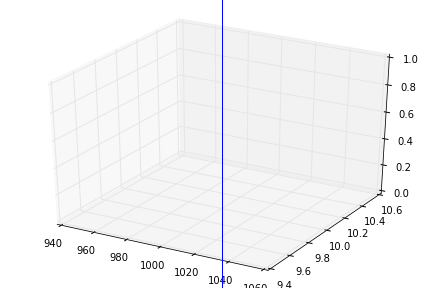
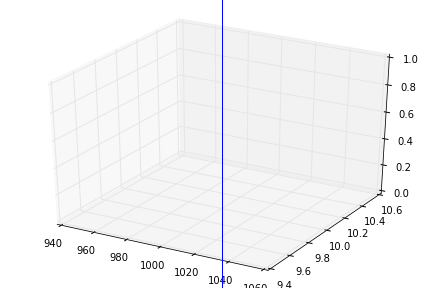
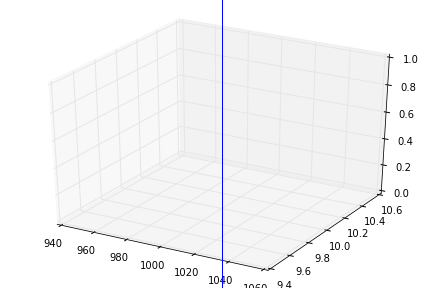
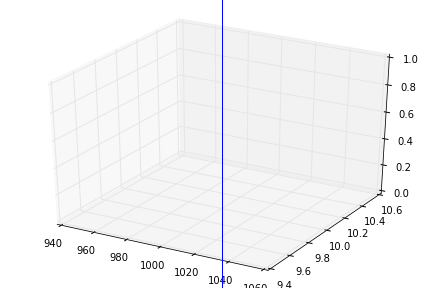

In [31]:
# Ok let's try this with the Euler scheme...
dx = 20000
dy = 20000
dt = 20000
H = 4000
g=9.8
h0 = 0.001
xend = 1000
yend = 10
timeend = 1000
E = np.sqrt(H)
U = np.sqrt(g)
L = np.sqrt(H)
T = 1/np.sqrt(g)

X, Y = np.meshgrid(xend, yend)

# define the first frame 
fig = plt.figure()
ax = axes3d.Axes3D(fig)
wframe = ax.plot_wireframe(X, Y, h, rstride=2, cstride=2)
ax.set_zlim(0,1)

u = np.zeros((xend,yend))
v = np.zeros((xend,yend))
h = np.zeros((xend,yend))
uo = np.zeros((xend,yend))
vo = np.zeros((xend,yend))
ho = np.zeros((xend,yend))
f = np.zeros(yend)
fo = np.zeros(yend)

h[1,0:yend] = h0
h[2,0:yend] = h0

def update(i, ax, fig):
    ax.cla()
    ho = h; uo = u; vo = v
    
    for i in range(1,xend-1):
        for j in range(1,yend-1):
            h[i,j] = dt*(-(uo[i+1,j] - uo[i-1,j])/dx/2 - (vo[i,j+1] - vo[i,j-1])/dy/2) + ho[i,j]
            
    for i in range(1,xend-1):
        for j in range(1,yend-1):
            u[i,j] = dt*(ho[i+1,j] - ho[i-1,j])/dx/2 - uo[i,j] + dt*f[j]*vo[i,j]
            v[i,j] = dt*(ho[i,j+1] - ho[i,j-1])/dy/2 - vo[i,j] + dt*f[j]*uo[i,j]
            
    wframe = ax.plot_wireframe(X, Y, h, rstride=2, cstride=2)
    ax.set_zlim(0,1)
    return wframe

anim = animation.FuncAnimation(fig, update, 
        frames=range(100), 
        fargs=(ax, fig), interval=100)


display_animation(anim, default_mode='loop')
            

In [5]:
print(len(xspan))

100
